In [ ]:
#ResNet
import matplotlib.pyplot as plotter_lib
import numpy as np
import PIL as image_lib
import tensorflow as tflow
from tensorflow.keras import models, layers
from tensorflow.keras.layers import Flatten
from keras.layers.core import Dense
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
import pathlib


In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
from google.colab import files

Mounted at /content/gdrive


In [ ]:
##demo_dataset = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
##directory = tflow.keras.utils.get_file('flower_photos', origin=demo_dataset, untar=True)
##data_directory = pathlib.Path(directory)

data_directory = pathlib.Path("/content/gdrive/MyDrive/model (1)/cabbage_resizedResNet")
img_height,img_width=180,180
batch_size=32

In [ ]:
train_ds = tflow.keras.preprocessing.image_dataset_from_directory(
  data_directory,
  validation_split=0.2,
  subset="training",
    seed=123,
label_mode='categorical',
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1003 files belonging to 3 classes.
Using 803 files for training.


In [ ]:
validation_ds = tflow.keras.preprocessing.image_dataset_from_directory(
  data_directory,
  validation_split=0.2,
  subset="validation",
  seed=123,

label_mode='categorical',
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1003 files belonging to 3 classes.
Using 200 files for validation.


In [ ]:
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS=3
EPOCHS= 50

In [ ]:
test_ds = tflow.keras.preprocessing.image_dataset_from_directory(
  data_directory,
  validation_split=0.1,
  subset="validation",
  seed=123,

label_mode='categorical',
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 1003 files belonging to 3 classes.
Using 100 files for validation.


In [ ]:
class_names = validation_ds.class_names
class_names

['cabbage', 'empty field', 'weed']

In [ ]:
class_names = train_ds.class_names
class_names

['cabbage', 'empty field', 'weed']

In [ ]:
import matplotlib.pyplot as plotter_lib
import matplotlib.pyplot as plt
plotter_lib.figure(figsize=(10, 10))
epochs=30



<Figure size 1000x1000 with 0 Axes>

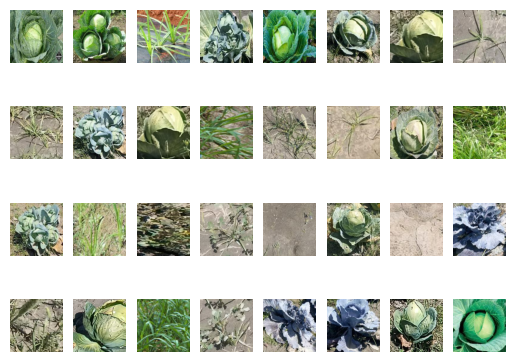

In [ ]:
for images, labels in train_ds.take(1):
 for var in range(32):
    ax = plt.subplot(4, 8, var + 1)
    plotter_lib.imshow(images[var].numpy().astype("uint8"))
    plotter_lib.axis("off")


In [ ]:
demo_resnet_model = Sequential()
pretrained_model_for_demo= tflow.keras.applications.ResNet50(include_top=False,
                   input_shape=(180,180,3),
                   pooling='avg',classes=3,
                   weights='imagenet')

for each_layer in pretrained_model_for_demo.layers:
        each_layer.trainable=False

demo_resnet_model.add(pretrained_model_for_demo)


demo_resnet_model.add(Flatten())
demo_resnet_model.add(Dense(512, activation='relu'))
demo_resnet_model.add(Dense(3, activation='softmax'))


94765736/94765736 [==============================] - 0s 0us/step


In [ ]:
demo_resnet_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dense_1 (Dense)             (None, 3)                 1539      
                                                                 
Total params: 24,638,339
Trainable params: 1,050,627
Non-trainable params: 23,587,712
_________________________________________________________________


In [ ]:
demo_resnet_model.compile(optimizer=Adam(learning_rate=0.001),loss='categorical_crossentropy',metrics=['accuracy'])
history = demo_resnet_model.fit(train_ds, validation_data=validation_ds, epochs=epochs)


Epoch 1/30
26/26 [==============================] - 70s 2s/step - loss: 0.2841 - accuracy: 0.9128 - val_loss: 0.0444 - val_accuracy: 0.9750
Epoch 2/30
26/26 [==============================] - 3s 93ms/step - loss: 0.0312 - accuracy: 0.9913 - val_loss: 0.0133 - val_accuracy: 0.9900
Epoch 3/30
26/26 [==============================] - 3s 93ms/step - loss: 0.0210 - accuracy: 0.9925 - val_loss: 0.0339 - val_accuracy: 0.9900
Epoch 4/30
26/26 [==============================] - 3s 92ms/step - loss: 0.0149 - accuracy: 0.9950 - val_loss: 0.0049 - val_accuracy: 1.0000
Epoch 5/30
26/26 [==============================] - 3s 104ms/step - loss: 0.0120 - accuracy: 0.9975 - val_loss: 0.0070 - val_accuracy: 0.9950
Epoch 6/30
26/26 [==============================] - 3s 93ms/step - loss: 0.0058 - accuracy: 0.9975 - val_loss: 0.0047 - val_accuracy: 1.0000
Epoch 7/30
26/26 [==============================] - 3s 93ms/step - loss: 0.0124 - accuracy: 0.9975 - val_loss: 0.0046 - val_accuracy: 1.0000
Epoch 8/30
26

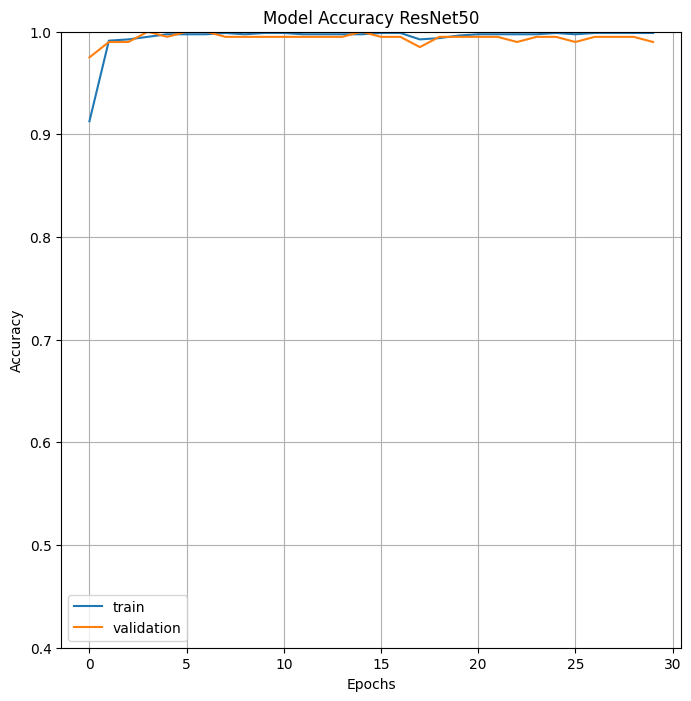

In [ ]:
plotter_lib.figure(figsize=(8, 8))
epochs_range= range(epochs)
plotter_lib.plot( epochs_range, history.history['accuracy'], label="Training Accuracy")
plotter_lib.plot(epochs_range, history.history['val_accuracy'], label="Validation Accuracy")
plotter_lib.axis(ymin=0.4,ymax=1)
plotter_lib.grid()
plotter_lib.title('Model Accuracy ResNet50')
plotter_lib.ylabel('Accuracy')
plotter_lib.xlabel('Epochs')
plotter_lib.legend(['train', 'validation'])
#plotter_lib.show()
plotter_lib.savefig('output-plot.png')



In [ ]:
#import cv2
#sample_image=cv2.imread(str(roses[0]))
#sample_image_resized= cv2.resize(sample_image, (img_height,img_width))
#sample_image=np.expand_dims(sample_image_resized,axis=0)


In [ ]:
#image_pred=resnet_model.predict(image)
#image_output_class=class_names[np.argmax(image_pred)]
#print("The predicted class is", image_output_class)



In [ ]:
class_names = validation_ds.class_names
class_names

['cabbage', 'empty field', 'weed']

In [ ]:
def predict(model, img):
    img_array = tflow.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tflow.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

1/1 [==============================] - 0s 29ms/step


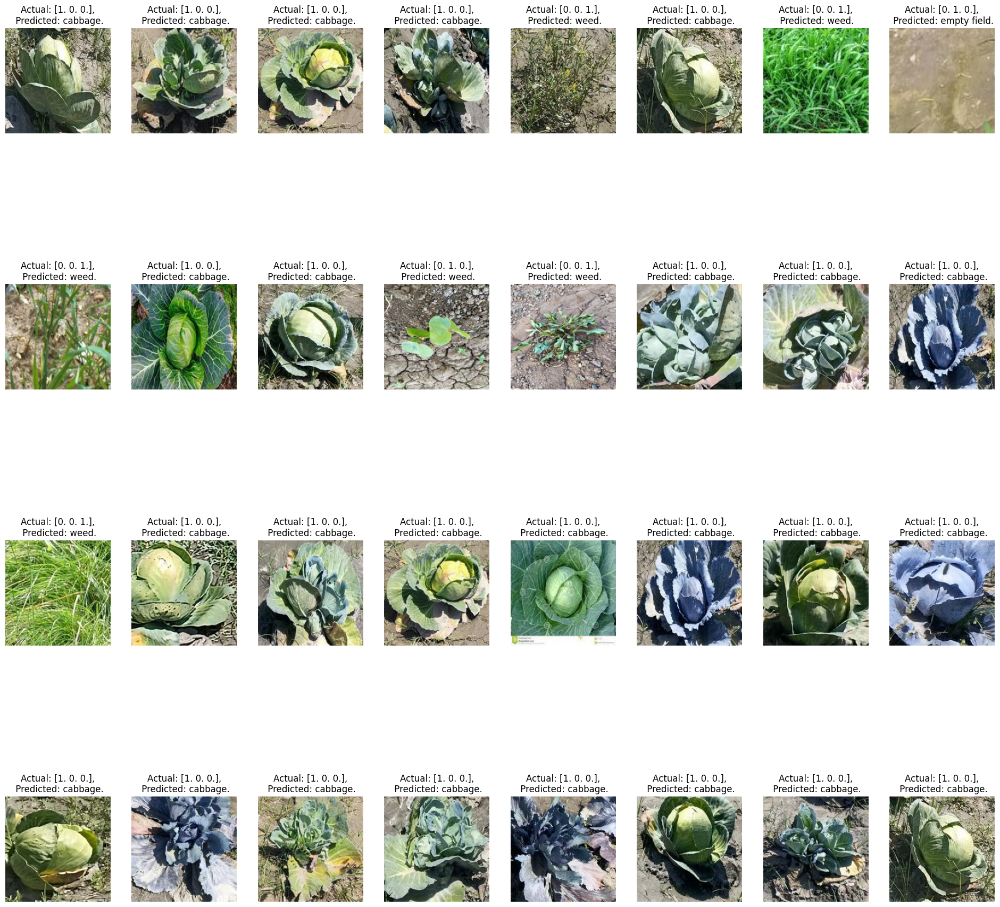

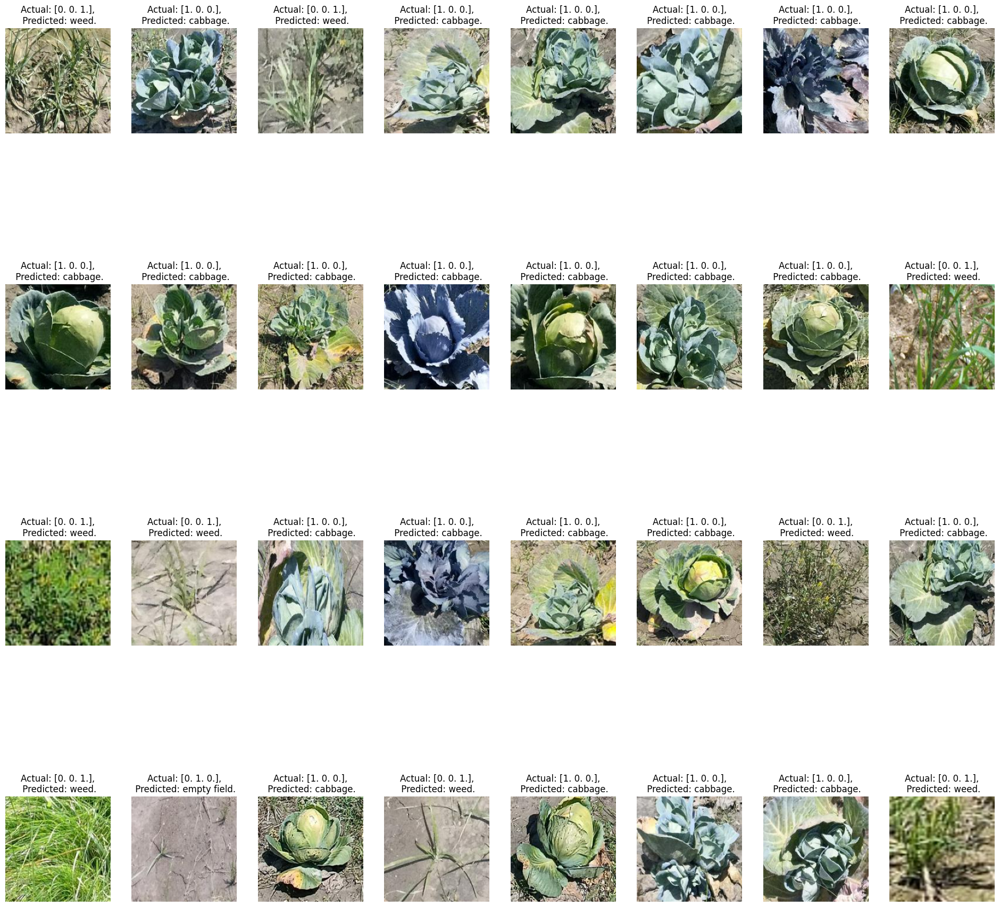

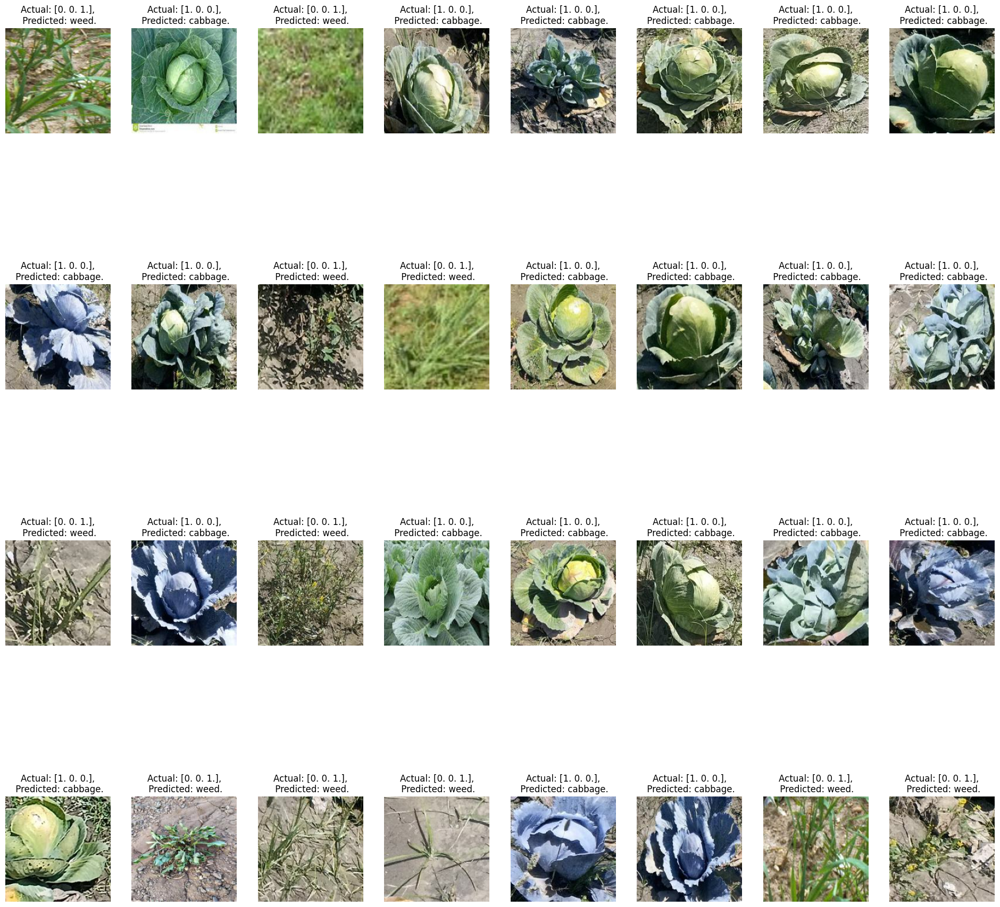

In [ ]:
plt.figure(figsize=(24, 24))
for images, labels in test_ds.take(1):
    for i in range(32):
        ax = plt.subplot(4, 8, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(demo_resnet_model, images[i].numpy())
        actual_class = labels[i]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.")

        plt.axis("off")
plt.figure(figsize=(24, 24))
for images, labels in test_ds.take(2):
    for i in range(32):
        ax = plt.subplot(4, 8, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(demo_resnet_model, images[i].numpy())
        actual_class = labels[i]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.")

        plt.axis("off")
plt.figure(figsize=(24, 24))
for images, labels in test_ds.take(3):
    for i in range(32):
        ax = plt.subplot(4, 8, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))

        predicted_class, confidence = predict(demo_resnet_model, images[i].numpy())
        actual_class = labels[i]

        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.")

        plt.axis("off")


In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

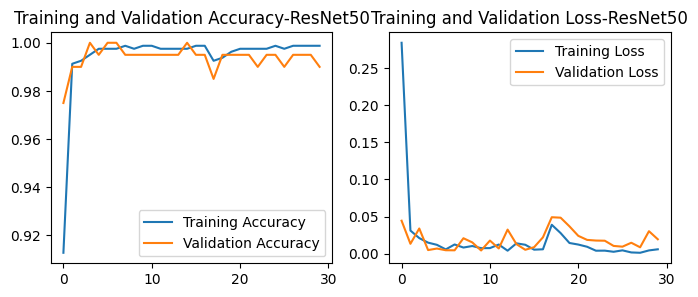

In [ ]:
EPOCHS=30
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(8, 3))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy-ResNet50')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss-ResNet50')
plt.show()

In [ ]:
#Test Data
Test_dataset1 = tflow.keras.preprocessing.image_dataset_from_directory("/content/gdrive/MyDrive/cabbage_resizedAlexNetTest", seed=0,shuffle=False, image_size=(IMAGE_SIZE,IMAGE_SIZE),batch_size=BATCH_SIZE)

Found 300 files belonging to 3 classes.


In [ ]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

In [ ]:
for image_batch, labels_batch in Test_dataset1.take(20):
    print(labels_batch.numpy())

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]
[1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
[2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
[2 2 2 2 2 2 2 2 2 2 2 2]


In [ ]:
from sklearn.metrics import confusion_matrix
import tensorflow as tf
import numpy as np

# Assuming you have the predicted labels stored in `resnet_predictions` and true labels in `true_labels`
resnet_predictions = []  # Store the predictions made by the improved ResNet model
true_labels = []  # Store the true labels for the corresponding images

for images_batch, labels_batch in Test_dataset1.take(20):
    # Resize images to the expected shape
    resized_images = tf.image.resize(images_batch, (180, 180))

    predictions = demo_resnet_model.predict(resized_images)
    predicted_labels = np.argmax(predictions, axis=1)

    resnet_predictions.extend(predicted_labels)
    true_labels.extend(labels_batch.numpy())

# Create the confusion matrix
cm = confusion_matrix(true_labels, resnet_predictions)

# Print the confusion matrix
print("Confusion Matrix (Improved ResNet):")
print(cm)


1/1 [==============================] - 1s 670ms/step
Confusion Matrix (Improved ResNet):
[[100   0   0]
 [  4  90   6]
 [  9  48  43]]


1/1 [==============================] - 0s 27ms/step
Confusion Matrix (Improved ResNet):
[[100   0   0]
 [  4  90   6]
 [  9  48  43]]


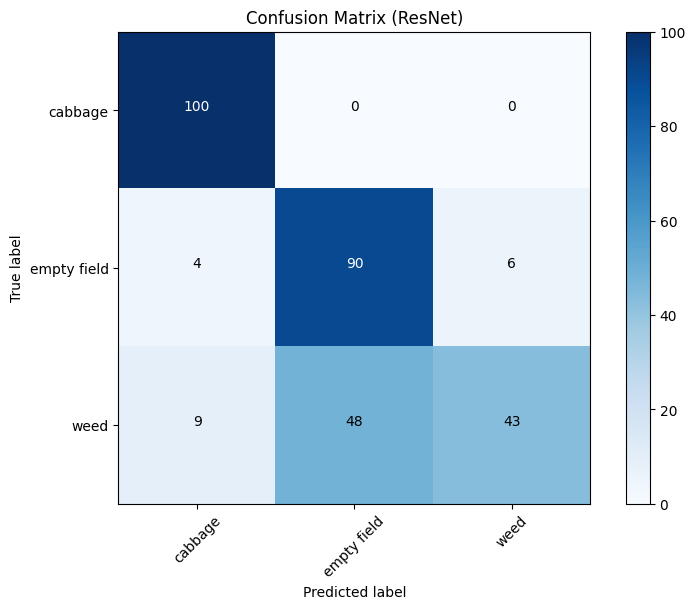

In [ ]:
from sklearn.metrics import confusion_matrix
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have the predicted labels stored in `resnet_predictions` and true labels in `true_labels`
resnet_predictions = []  # Store the predictions made by the improved ResNet model
true_labels = []  # Store the true labels for the corresponding images

for images_batch, labels_batch in Test_dataset1.take(20):
    # Resize images to the expected shape
    resized_images = tf.image.resize(images_batch, (180, 180))

    predictions = demo_resnet_model.predict(resized_images)
    predicted_labels = np.argmax(predictions, axis=1)

    resnet_predictions.extend(predicted_labels)
    true_labels.extend(labels_batch.numpy())

# Create the confusion matrix
cm = confusion_matrix(true_labels, resnet_predictions)

# Print the confusion matrix
print("Confusion Matrix (Improved ResNet):")
print(cm)

# Plot the confusion matrix as a graph
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix (ResNet)')
plt.colorbar()
classes=['cabbage', 'empty field', 'weed']
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

# Add labels to each cell
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


In [ ]:
# Compute metrics from the confusion matrix
epsilon = 1e-8  # Small epsilon value to avoid division by zero
accuracy = np.sum(np.diag(cm)) / np.sum(cm)
recall = np.diag(cm) / (np.sum(cm, axis=1) + epsilon)
precision = np.diag(cm) / (np.sum(cm, axis=0) + epsilon)
f1_score = 2 * (precision * recall) / (precision + recall + epsilon)

# Print the computed metrics
print("Accuracy: {:.2f}".format(accuracy))
print("Recall: {:.2f}".format(np.mean(recall)))
print("Precision: {:.2f}".format(np.mean(precision)))
print("F1 Score: {:.2f}".format(np.mean(f1_score)))



Accuracy: 0.78
Recall: 0.78
Precision: 0.80
F1 Score: 0.76


In [ ]:
# image resizing
'''
from PIL import Image
import os

# Directory containing the images
directory = 'D:\iStudent\dib\cabbage_resizedResNet\weed'#'D:\iStudent\dib\cabbage_resizedResNet\empty field' #'D:\iStudent\dib\cabbage_resizedResNet\cabbage'

# Target size for resizing
target_size = (180, 180)

# Iterate over each file in the directory
for filename in os.listdir(directory):
    # Check if the file is an image
    if filename.endswith(".jpg") or filename.endswith(".png") or filename.endswith(".jpeg"):
        # Open the image file
        image_path = os.path.join(directory, filename)
        image = Image.open(image_path)

        # Resize the image
        resized_image = image.resize(target_size)

        # Save the resized image, overwriting the original file
        resized_image.save(image_path)

        print(f"Resized {filename} successfully!")
'''

'\nfrom PIL import Image\nimport os\n\n# Directory containing the images\ndirectory = \'D:\\iStudent\\dib\\cabbage_resizedResNet\\weed\'#\'D:\\iStudent\\dib\\cabbage_resizedResNet\\empty field\' #\'D:\\iStudent\\dib\\cabbage_resizedResNet\\cabbage\'\n\n# Target size for resizing\ntarget_size = (180, 180)\n\n# Iterate over each file in the directory\nfor filename in os.listdir(directory):\n    # Check if the file is an image\n    if filename.endswith(".jpg") or filename.endswith(".png") or filename.endswith(".jpeg"):\n        # Open the image file\n        image_path = os.path.join(directory, filename)\n        image = Image.open(image_path)\n\n        # Resize the image\n        resized_image = image.resize(target_size)\n\n        # Save the resized image, overwriting the original file\n        resized_image.save(image_path)\n\n        print(f"Resized {filename} successfully!")\n'

In [ ]:
# improved model

In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten

improved_resnet_model = Sequential()

pretrained_model = ResNet50(include_top=False,
                            input_shape=(180, 180, 3),
                            pooling='avg',
                            weights='imagenet')

for each_layer in pretrained_model.layers:
    each_layer.trainable = False

improved_resnet_model.add(pretrained_model)

#added layers
#improved_resnet_model.add(Dense(1024, activation='relu'))
improved_resnet_model.add(Dense(256, activation='relu'))
improved_resnet_model.add(Dense(128, activation='relu'))
improved_resnet_model.add(Dense(64, activation='relu'))
improved_resnet_model.add(Dense(32, activation='relu'))
improved_resnet_model.add(Dense(16, activation='relu'))
#improved_resnet_model.add(Dense(8, activation='relu'))
improved_resnet_model.add(Dense(4, activation='relu'))
#improved_resnet_model.add(Dense(2, activation='relu'))

#end of addition
improved_resnet_model.add(Dense(512, activation='relu'))
improved_resnet_model.add(Dense(3, activation='softmax'))
improved_resnet_model.add(Flatten())

# Printing the model summary
improved_resnet_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 dense_2 (Dense)             (None, 256)               524544    
                                                                 
 dense_3 (Dense)             (None, 128)               32896     
                                                                 
 dense_4 (Dense)             (None, 64)                8256      
                                                                 
 dense_5 (Dense)             (None, 32)                2080      
                                                                 
 dense_6 (Dense)             (None, 16)                528       
                                                                 
 dense_7 (Dense)             (None, 4)                

In [ ]:
improved_resnet_model.compile(optimizer=Adam(learning_rate=0.001),loss='categorical_crossentropy',metrics=['accuracy'])
history = improved_resnet_model.fit(train_ds, validation_data=validation_ds, epochs=epochs)

Epoch 1/30
26/26 [==============================] - 11s 138ms/step - loss: 0.5596 - accuracy: 0.6513 - val_loss: 0.0985 - val_accuracy: 0.9600
Epoch 2/30
26/26 [==============================] - 3s 94ms/step - loss: 0.1362 - accuracy: 0.9365 - val_loss: 0.0518 - val_accuracy: 0.9950
Epoch 3/30
26/26 [==============================] - 3s 94ms/step - loss: 0.1050 - accuracy: 0.9888 - val_loss: 0.0504 - val_accuracy: 0.9950
Epoch 4/30
26/26 [==============================] - 3s 120ms/step - loss: 0.0745 - accuracy: 0.9950 - val_loss: 0.0401 - val_accuracy: 0.9900
Epoch 5/30
26/26 [==============================] - 3s 101ms/step - loss: 0.0611 - accuracy: 0.9938 - val_loss: 0.0474 - val_accuracy: 0.9850
Epoch 6/30
26/26 [==============================] - 3s 95ms/step - loss: 0.0475 - accuracy: 0.9950 - val_loss: 0.0394 - val_accuracy: 0.9900
Epoch 7/30
26/26 [==============================] - 3s 94ms/step - loss: 0.0204 - accuracy: 0.9988 - val_loss: 0.0341 - val_accuracy: 0.9900
Epoch 8/3

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

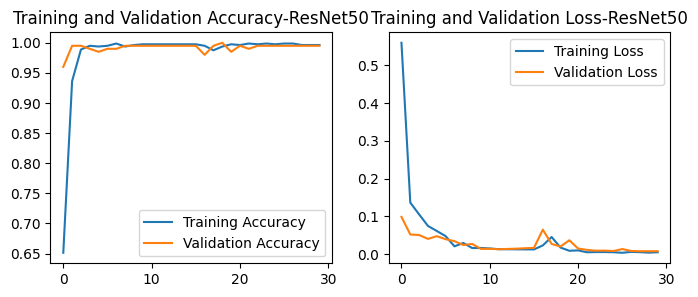

In [ ]:
EPOCHS=30
import matplotlib.pyplot as plt
import numpy as np
plt.figure(figsize=(8, 3))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy-ResNet50')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss-ResNet50')
plt.show()

In [ ]:
#print("conf matrix alexNet")
#import numpy as np
#j=1
#for images_batch, labels_batch in Test_dataset1.take(20):
 #   i=0
  #  for i in range(32):
   #     first_image = images_batch[i].numpy().astype('uint8')
    #    first_label = labels_batch[i].numpy()
     #  #print("first image to predict")
       #plt.imshow(first_image)
      #  batch_prediction = improved_resnet_model.predict(images_batch)
       # print(str(j)+": "+class_names[first_label]+"---> "+class_names[np.argmax(batch_prediction[i])])
        #j=j+1
        #if j==301:
         #  break

In [ ]:
from sklearn.metrics import confusion_matrix
import tensorflow as tf
import numpy as np

# Assuming you have the predicted labels stored in `resnet_predictions` and true labels in `true_labels`
resnet_predictions = []  # Store the predictions made by the improved ResNet model
true_labels = []  # Store the true labels for the corresponding images

for images_batch, labels_batch in Test_dataset1.take(20):
    # Resize images to the expected shape
    resized_images = tf.image.resize(images_batch, (180, 180))

    predictions = improved_resnet_model.predict(resized_images)
    predicted_labels = np.argmax(predictions, axis=1)

    resnet_predictions.extend(predicted_labels)
    true_labels.extend(labels_batch.numpy())

# Create the confusion matrix
cm = confusion_matrix(true_labels, resnet_predictions)

# Print the confusion matrix
print("Confusion Matrix (Improved ResNet):")
print(cm)


1/1 [==============================] - 1s 929ms/step
Confusion Matrix (Improved ResNet):
[[100   0   0]
 [  2  90   8]
 [  1  29  70]]


1/1 [==============================] - 0s 38ms/step
Confusion Matrix (Improved ResNet):
[[100   0   0]
 [  2  90   8]
 [  1  29  70]]


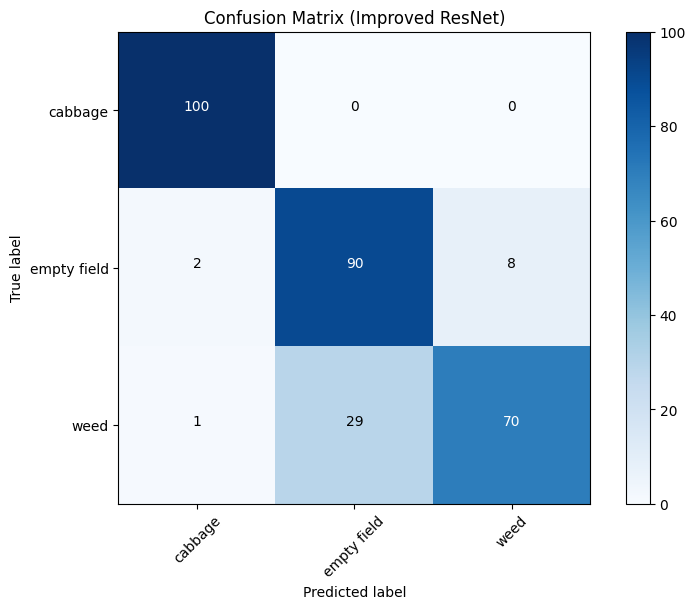

In [ ]:
from sklearn.metrics import confusion_matrix
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have the predicted labels stored in `resnet_predictions` and true labels in `true_labels`
resnet_predictions = []  # Store the predictions made by the improved ResNet model
true_labels = []  # Store the true labels for the corresponding images

for images_batch, labels_batch in Test_dataset1.take(20):
    # Resize images to the expected shape
    resized_images = tf.image.resize(images_batch, (180, 180))

    predictions = improved_resnet_model.predict(resized_images)
    predicted_labels = np.argmax(predictions, axis=1)

    resnet_predictions.extend(predicted_labels)
    true_labels.extend(labels_batch.numpy())

# Create the confusion matrix
cm = confusion_matrix(true_labels, resnet_predictions)

# Print the confusion matrix
print("Confusion Matrix (Improved ResNet):")
print(cm)

# Plot the confusion matrix as a graph
plt.figure(figsize=(8, 6))
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix (Improved ResNet)')
plt.colorbar()
classes=['cabbage', 'empty field', 'weed']
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

# Add labels to each cell
thresh = cm.max() / 2.
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Calculate accuracy
accuracy = accuracy_score(true_labels, resnet_predictions)

# Calculate precision
precision = precision_score(true_labels, resnet_predictions, average='weighted')

# Calculate recall
recall = recall_score(true_labels, resnet_predictions, average='weighted')

# Calculate F1 score
f1 = f1_score(true_labels, resnet_predictions, average='weighted')

# Print the metrics
print("Accuracy: {:.2f}%".format(accuracy * 100))
print("Precision: {:.2f}%".format(precision * 100))
print("Recall: {:.2f}%".format(recall * 100))
print("F1 Score: {:.2f}%".format(f1 * 100))


Accuracy: 86.67%
Precision: 87.49%
Recall: 86.67%
F1 Score: 86.46%
